# unimib/DSIM 2025-2026: Task 2

Intensity Analysis - E. Mosca 925279

The average setting of our images is quite standardized, a plant leaf placed close to the camera on a somewhat uniform background, though lighting, orientation and other factors might vary.

In [ ]:
import torch.utils.data as data
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt
import numpy as np

Going to be working on the same train set as the exploration.ipynb file.

In [ ]:
path_on_gdrive = 'gdrive/My Drive/dsim/Plant_leave_diseases_dataset_without_augmentation.zip'
dataset_filename = 'Plant_leave_diseases_dataset_without_augmentation' # do not include the '.zip' extension in the name

In [ ]:
from google.colab import drive
import zipfile
from shutil import copyfile
drive.mount('/content/gdrive')
copyfile(path_on_gdrive, dataset_filename+'.zip')
zipf = zipfile.ZipFile(dataset_filename+'.zip')
zipf.extractall()
zipf.close()

Mounted at /content/gdrive


In [ ]:
dataset = ImageFolder(root=dataset_filename, transform=transforms.ToTensor())

In [ ]:
# Stratified split into train (80%), val (10%), test (10%)
from sklearn.model_selection import train_test_split

labels = [sample[1] for sample in dataset.samples]

#80% train, 20% temp
train_indices, temp_indices = train_test_split(
    range(len(dataset)),
    test_size=0.2,
    stratify=labels,
    random_state=42
)

# split the 20% into 50-50 for val (10%) and test (10%)
temp_labels = [labels[i] for i in temp_indices]
val_indices, test_indices = train_test_split(
    temp_indices,
    test_size=0.5,
    stratify=temp_labels,
    random_state=42
)

train_dataset = data.Subset(dataset, train_indices)
val_dataset = data.Subset(dataset, val_indices)
test_dataset = data.Subset(dataset, test_indices)

### Histogram analysis

Moving on, histograms can be analyzed to understand intensity values' distribution both across color channels and in gray-levels. The train dataset is too big to use for the computation of these statistics; so, will have to rely on a representative subset with fewer(10%) samples.

This analysis can also show any noise present in the data, and shed light on the contrast situations present in the dataset.

In [ ]:
len(train_dataset)

44358

In [ ]:
#obtain 4000 random, stratified samples from train_dataset
from sklearn.model_selection import train_test_split
train_labels = [train_dataset.dataset.samples[i][1] for i in train_indices]
train_indices_resampled, _ = train_test_split(
    train_indices,
    train_size=int(len(train_dataset)*0.1),
    stratify=train_labels,
    random_state=42
)
train_subset = data.Subset(train_dataset.dataset, train_indices_resampled)

Text(0.5, 1.0, 'Label: Apple___healthy')

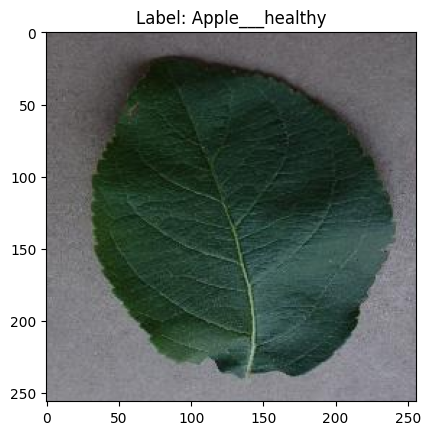

In [ ]:
plt.imshow(train_subset[-1][0].permute(1, 2, 0))
plt.title(f"Label: {dataset.classes[train_subset[-1][1]]}")

Obtaining the per-channel intensity histogram to inspect the distribution

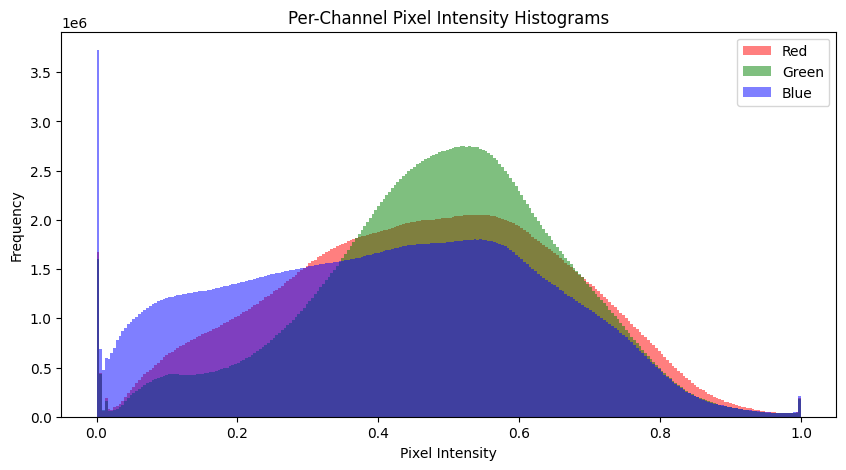

In [ ]:
# Collect pixel values for each channel separately
channel_pixel_values = [[], [], []]  # (RGB)
for img, label in train_subset:
    img_np = img.numpy()  # shape (C, H, W)
    for c in range(3):
        channel_pixel_values[c].append(img_np[c].flatten())
# Concatenate all pixel values for each channel
channel_pixel_values = [np.concatenate(channel_pixel_values[c]) for c in range(3)]

# Plot histograms for each channel
colors = ['red', 'green', 'blue']
plt.figure(figsize=(10, 5))
for c in range(3):
    plt.hist(channel_pixel_values[c], bins=256, color=colors[c], alpha=0.5, label=f'Channel {c}')#binning to 256 as initial reads from JPEG file have uint8 values
plt.title("Per-Channel Pixel Intensity Histograms")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.legend(['Red', 'Green', 'Blue'])
plt.show()

While the green channel is the most symmetrically distributed, red and blue(especially) have higher variance in the intensity values, but behavior in the right tail is similar for all channels. The peak at the 0-value bin in the blue channel shows frequent lack of blue channel information in the dataset.

In [ ]:
#per channel mean and std
channel_avgs, channel_stds = [np.mean(channel_pixel_values[c]) for c in range(3)], [np.std(channel_pixel_values[c]) for c in range(3)]
print("AVG Red channel value:", channel_avgs[0],"STD Red channel value:", channel_stds[0])
print("AVG Green channel value:", channel_avgs[1],"STD Green channel value:", channel_stds[1])
print("AVG Blue channel value:", channel_avgs[2],"STD Blue channel value:", channel_stds[2])

AVG Red channel value: 0.4660194 STD Red channel value: 0.19943494
AVG Green channel value: 0.48811698 STD Green channel value: 0.17584032
AVG Blue channel value: 0.41002637 STD Blue channel value: 0.2184831


Reasonably, blue channel mean is lower given it is weighted down by the 0-value spike and its SD is higher, green channel mean is closer to 0.5 with a lower SD, and red channel is between the two

A reasonable next step would be to compare the intensity histograms for the background class and non-background classes in the subset

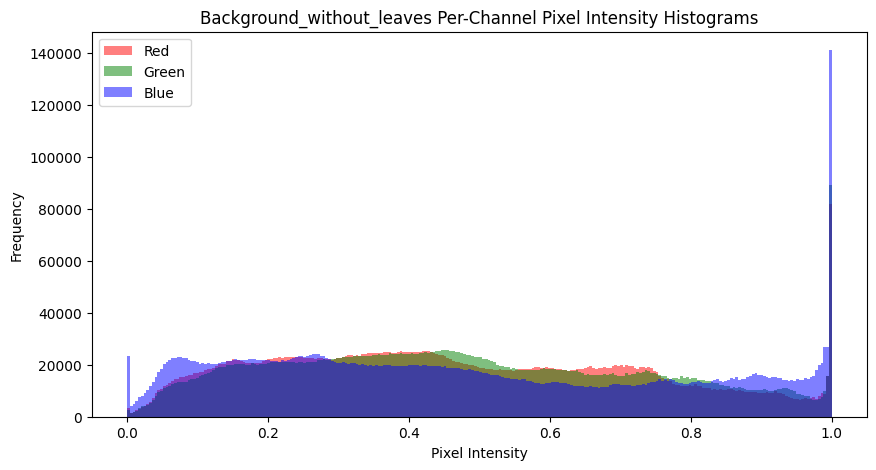

In [ ]:
# background_without_leaves subset histogram
classes = dataset.classes
background_indices = [i for i in train_indices_resampled if classes[train_subset.dataset.samples[i][1]] == 'Background_without_leaves']
background_subset = data.Subset(train_subset.dataset, background_indices)
background_pixel_values = [[], [], []]  # (RGB)
for img, label in background_subset:
    img_np = img.numpy()  # shape (C, H, W)
    for c in range(3):
        background_pixel_values[c].append(img_np[c].flatten())
# Concatenate all pixel values for each channel
background_pixel_values = [np.concatenate(background_pixel_values[c]) for c in range(3)]
# Plot histograms for each channel
colors = ['red', 'green', 'blue']
plt.figure(figsize=(10, 5))
for c in range(3):
    plt.hist(background_pixel_values[c], bins=256, color=colors[c], alpha=0.5, label=f'Channel {c}')#binning to 256 as initial reads from JPEG file have uint8 values
plt.title("Background_without_leaves Per-Channel Pixel Intensity Histograms")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.legend(['Red', 'Green', 'Blue'])
plt.show()

The background class histogram is way more evenly spread over the range than the histogram for all classes, so those images will tend have a better contrast. There is also an evident clipping effect, given the very high frequency of the highest bin, probably because of incident light in images, and something similar also happens in the lowest bin though not as strongly

For non-background classes:

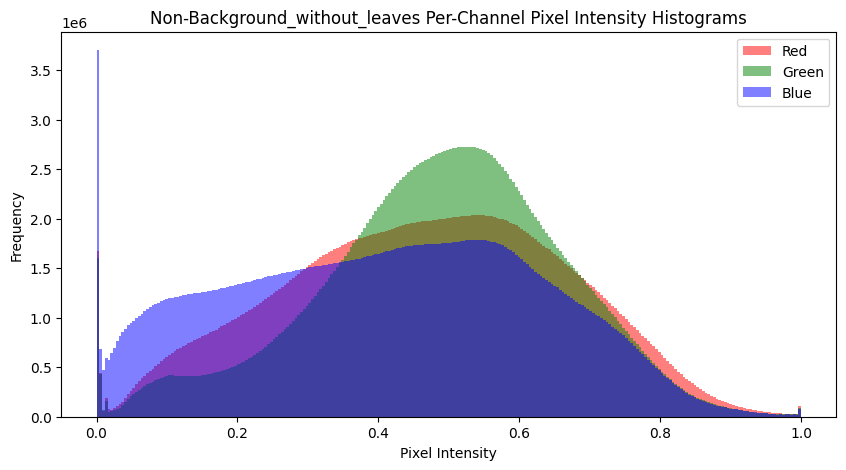

In [ ]:
# now for all other classes except background_without_leaves
non_background_indices = [i for i in train_indices_resampled if classes[train_subset.dataset.samples[i][1]] != 'Background_without_leaves']
non_background_subset = data.Subset(train_subset.dataset, non_background_indices)
non_background_pixel_values = [[], [], []]  # (RGB)
for img, label in non_background_subset:
    img_np = img.numpy()  # shape (C, H, W)
    for c in range(3):
        non_background_pixel_values[c].append(img_np[c].flatten())
# Concatenate all pixel values for each channel
non_background_pixel_values = [np.concatenate(non_background_pixel_values[c]) for c in range(3)]
# Plot histograms for each channel
colors = ['red', 'green', 'blue']
plt.figure(figsize=(10, 5))
for c in range(3):
    plt.hist(non_background_pixel_values[c], bins=256, color=colors[c], alpha=0.5, label=f'Channel {c}')#binning to 256 as initial reads from JPEG file have uint8 values
plt.title("Non-Background_without_leaves Per-Channel Pixel Intensity Histograms")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.legend(['Red', 'Green', 'Blue'])
plt.show()

The non-background classes histogram is inline with the entire subset one.

Now, images can be transformed to grayscale to obtain single-channel signals and to analyze gray level info.

In [ ]:
train_subset[0][0].shape

torch.Size([3, 256, 256])

In [ ]:
to_gscale = transforms.Compose([
    transforms.Grayscale(),
    transforms.ToTensor()
])

In [ ]:
#apply to_gscale to train_subset
gscale_data = data.Subset(ImageFolder(root=dataset_filename, transform=to_gscale),train_indices_resampled)

In [ ]:
gscale_data[0][0].shape

torch.Size([1, 256, 256])

Text(0.5, 1.0, 'Label: Apple___healthy')

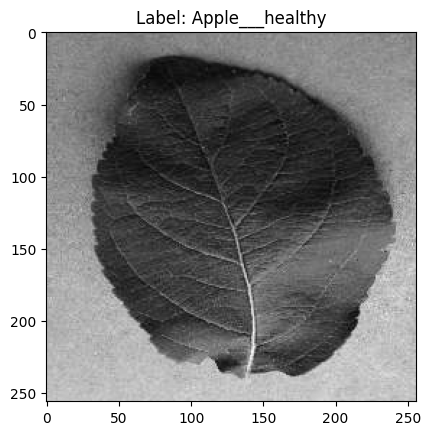

In [ ]:
plt.imshow(gscale_data[-1][0].squeeze(), cmap='gray')
plt.title(f"Label: {dataset.classes[gscale_data[-1][1]]}")

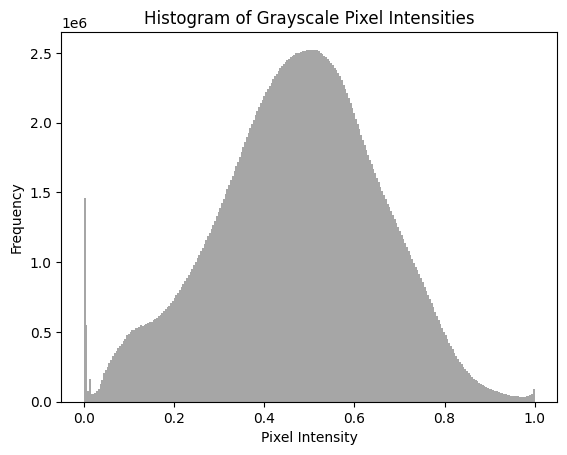

In [ ]:
#now to obtain the histogram of grayscale images
all_pixel_values_gs = []
for img, label in gscale_data:
    # img is a tensor of shape (1, H, W)
    img_np = img.numpy()
    img_avg = img_np[0]  # shape (H, W)
    all_pixel_values_gs.append(img_avg.flatten())  # flatten to 1D
# concatenate all pixel values
all_pixel_values_gs = np.concatenate(all_pixel_values_gs)
# compute histogram
plt.hist(all_pixel_values_gs, bins=256, color='gray', alpha=0.7) #binning to 256 as initial reads from JPEG file have uint8 values
plt.title("Histogram of Grayscale Pixel Intensities")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()

In this representative sample, the pixel intensity distribution avraged across channels is bell-shaped and mostly symmetric, but there is a peak in the lowest value bin meaning darker colors(lower intensity values) are frequent. There is also a slight up-tick in the highest intensity bin. The presence of 0-values might be caused by frequent, strong shadows, resulting in a pure black part of the image(also by clipping).

Overall, the distribution is more inline with low-contrast types of distributions i.e. focused around a certain value, rather than examples of high-contrast histograms where the distribution is close to a uniform over the entire range. One way of seeing this is that the images in the dataset tend to have, on average, low contrast and are affected by some noise from both tails, with frequent low value dark picture elements. The noise is visibly more apparent in grayscale images, but the cause might also be low resolution, both can be handled via sharpening or enhancement

In [ ]:
# average intensity and standard deviation
np.mean(all_pixel_values_gs), np.std(all_pixel_values_gs)

(np.float32(0.4726106), np.float32(0.18163092))

### Image Enhancement

Moving on to obtaining cleaner images, noise removal and sharpening techniques can be applied to our 2D signals.

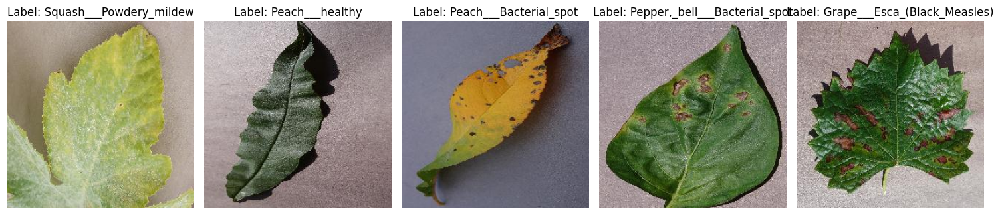

In [ ]:
# plot 5 random images from train_subset
np.random.seed(42)
random_indices = np.random.choice(len(train_subset), size=5, replace=False)
fig, axes = plt.subplots(1, 5, figsize=(15, 5))

for i, idx in enumerate(random_indices):
    img, label = train_subset[idx]
    img_np = img.permute(1, 2, 0).numpy()
    axes[i].imshow(img_np)
    axes[i].set_title(f"Label: {dataset.classes[label]}")
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In some images more than others leaf details are harder to spot. Another component of this dataset is that the surfaces/tabletops on which laves are placed are made of materials that give rise to a grainy, gaussian-noise-like pattern.
Once again shadows are also present, but their treatment isn't concerned by noise removal or sharpening...

We can start removing low-information content using a simple gaussian filter

In [ ]:
from skimage.filters import gaussian

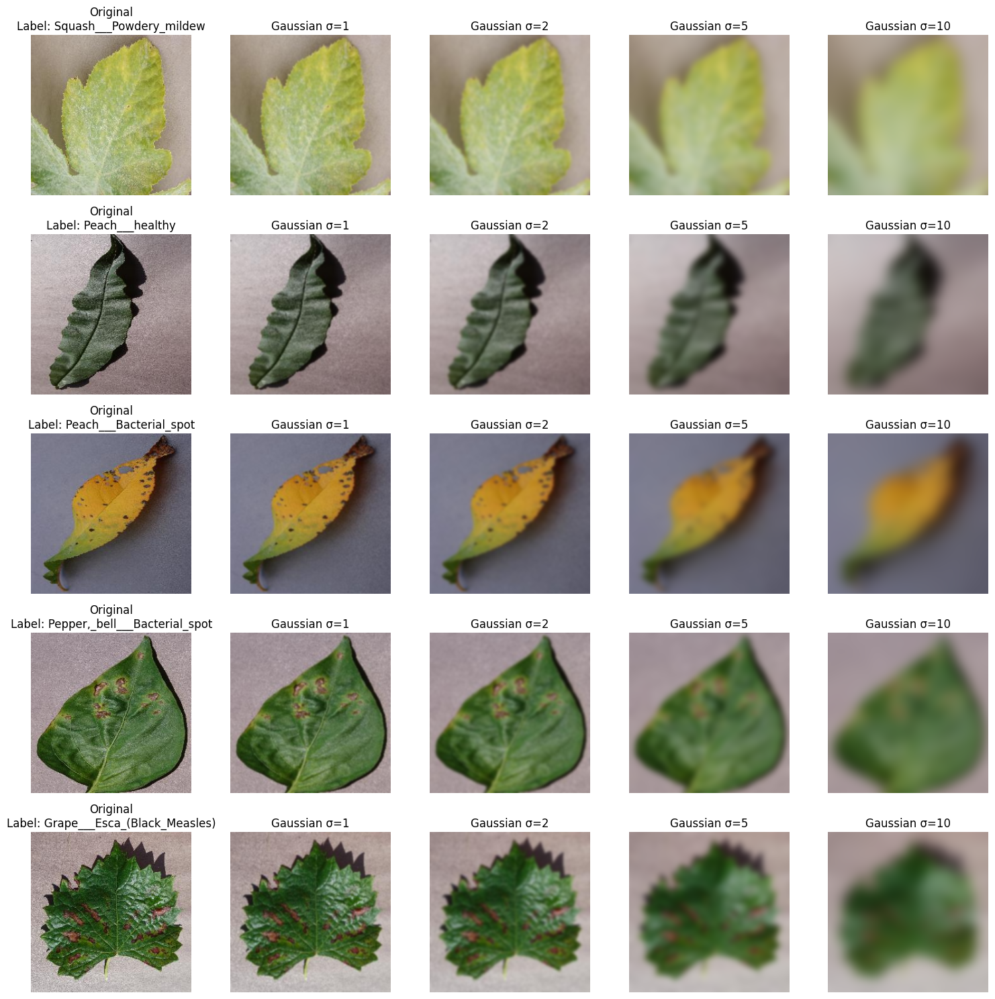

In [ ]:
#plot 5x5 grid with original and gaussian filtered random indices images for varying levels of sigma
sigmas = [1,2,5,10]
fig, axes = plt.subplots(5, 5, figsize=(15, 15))
for i, idx in enumerate(random_indices):
    img, label = train_subset[idx]
    img_np = img.permute(1, 2, 0).numpy()
    axes[i, 0].imshow(img_np)
    axes[i, 0].set_title(f"Original\nLabel: {dataset.classes[label]}")
    axes[i, 0].axis('off')
    for j, sigma in enumerate(sigmas):
        filtered_img = gaussian(img_np, sigma=sigma, channel_axis=-1)
        axes[i, j+1].imshow(filtered_img)
        axes[i, j+1].set_title(f"Gaussian σ={sigma}")
        axes[i, j+1].axis('off')
plt.tight_layout()
plt.show()

Through visual inspection alone, a gaussian filter might not help us with classifier performance, as information like leaf branches and their form/color is worsened only using a sigma equal to 1, yet this info should reasonably help our model discriminate between classes and there is no blatant benefit with respect to noise reduction. Blurring can still be useful in order to remove less important information before other operations

A different way of using the gaussian filter for cleaner images could be obtaining lower-information version of an image(lower frequency) with a gaussian filter, computing the difference between that version and the original and adding it back to obtain an higher(frequency) information version i.e. Unsharp Masking

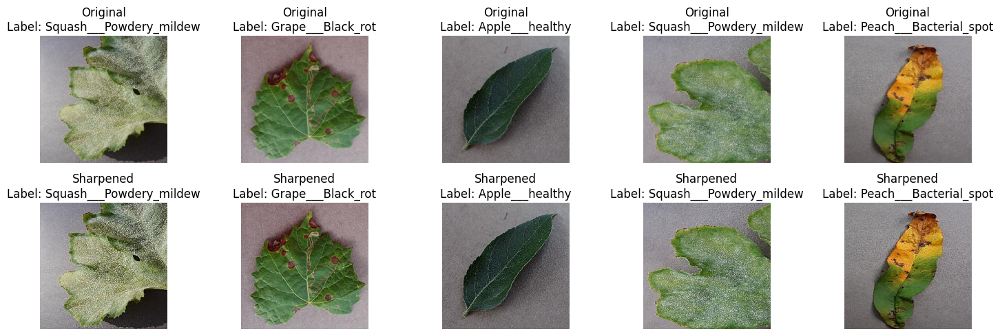

In [ ]:
# sharpen the image with high pass filter
from scipy.ndimage import gaussian_filter

np.random.seed(4242)
random_indices = np.random.choice(len(train_subset), size=5, replace=False)

def unsharp_mask(image, sigma=1):
    low_pass = gaussian(image, sigma=sigma, channel_axis=-1) #low freq version
    high_pass = image - low_pass #filter out low-freq info
    sharpened = image + high_pass #accentuate higher freq
    sharpened = np.clip(sharpened, 0, 1)  # ensure values are in [0, 1]
    return sharpened

#plot original and sharpened images
fig, axes = plt.subplots(2, 5, figsize=(15, 5))
for i, idx in enumerate(random_indices):
    img, label = train_subset[idx]
    img_np = img.permute(1, 2, 0).numpy()
    sharpened_img = unsharp_mask(img_np, sigma=1)
    axes[0, i].imshow(img_np)
    axes[0, i].set_title(f"Original\nLabel: {dataset.classes[label]}")
    axes[0, i].axis('off')
    axes[1, i].imshow(sharpened_img)
    axes[1, i].set_title(f"Sharpened\nLabel: {dataset.classes[label]}")
    axes[1, i].axis('off')
plt.tight_layout()
plt.show()

For some classes more than others details become more apparent, while for others that aren't characterised by detailed features there is not much difference. Using unsharp masking it also appears we run the risk of accentuating highly lit or dark parts of images

Another approach to refining our images through intensity manipulation is upsampling. Super-resolution can be used by interpolating non-existent pixel values from ones we already have, obtaining a higher resolution image as a result.

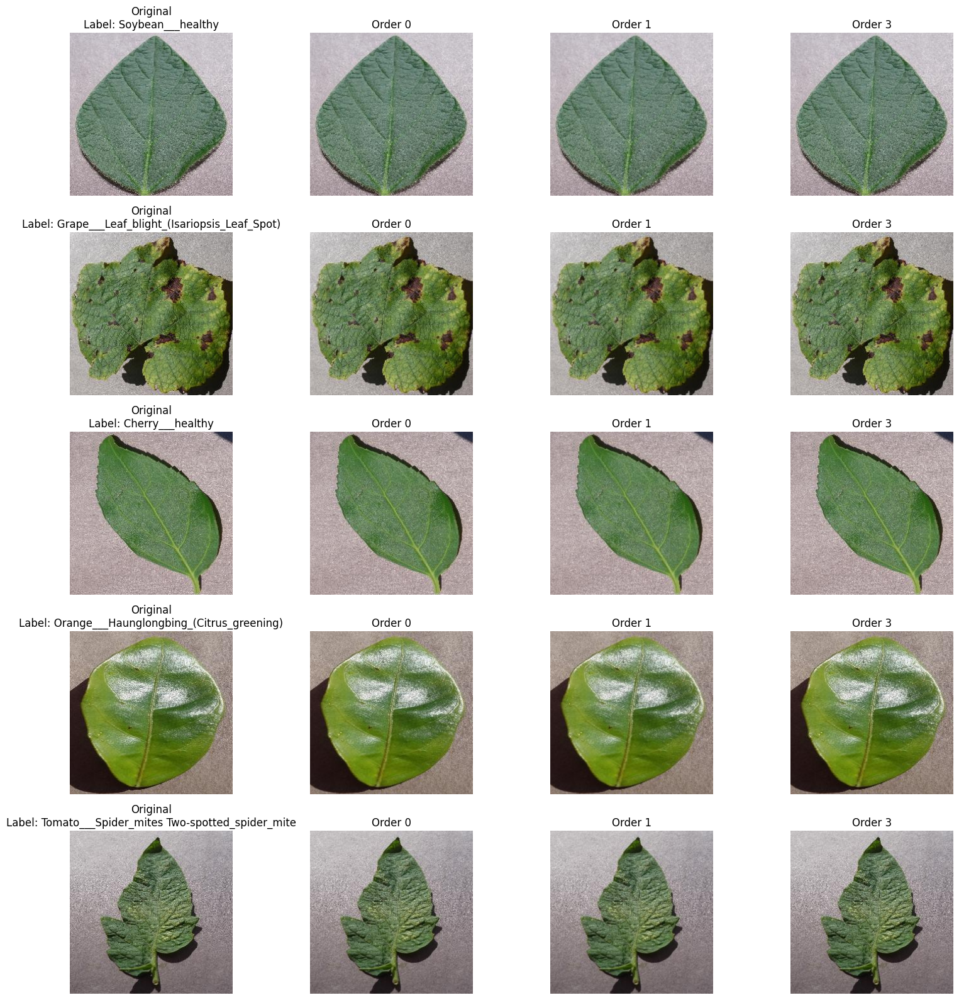

In [ ]:
from skimage.transform import warp
np.random.seed(424242)
random_indices = np.random.choice(len(train_subset), size=5, replace=False)
up_fac = 3
orders = [0, 1, 3]

# Create a 5x4 grid: each row is one image, columns are [original, order=0, order=1, order=3]
fig, axes = plt.subplots(5, 4, figsize=(16, 16))
for row, idx in enumerate(random_indices):
    img, label = train_subset[idx]
    img_np = img.permute(1, 2, 0).numpy()
    # First column: original image
    axes[row, 0].imshow(img_np)
    axes[row, 0].set_title(f"Original\nLabel: {dataset.classes[label]}")
    axes[row, 0].axis('off')
    # Next columns: upsampled images with different orders
    for col, order in enumerate(orders, start=1):
        upsampled_img = warp(
            img_np,
            inverse_map=lambda coords: coords / up_fac,
            order=order,
            mode='edge',
            output_shape=(img_np.shape[0]*up_fac, img_np.shape[1]*up_fac, img_np.shape[2])
        )
        axes[row, col].imshow(upsampled_img)
        axes[row, col].set_title(f"Order {order}")
        axes[row, col].axis('off')
plt.tight_layout()
plt.show()

Note: Order 0 is KNN upsampling, Order 1 is Bilinear, Order 3 is Bicubic

Improvement in detail can be noticed in the bicubic results, even though overall the benefits of upsampling seem mild.

As a last point of interest, gamma correction can be explored to verify if it can help handle different lighting conditions

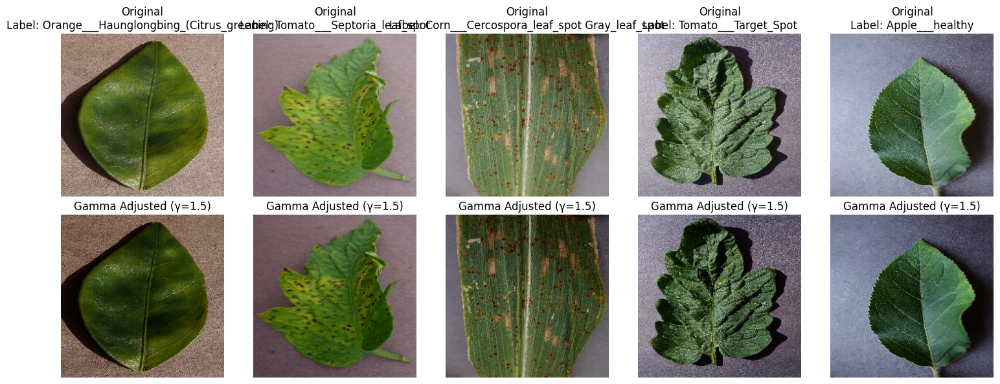

In [ ]:
from skimage.exposure import adjust_gamma
np.random.seed(42424242)
random_indices = np.random.choice(len(train_subset), size=5, replace=False)
# plot unaltered and gamma adjusted with gamma=1.5
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
gamma_value = 1.5
for i, idx in enumerate(random_indices):
    img, label = train_subset[idx]
    img_np = img.permute(1, 2, 0).numpy()

    # Original
    axes[0, i].imshow(img_np)
    axes[0, i].set_title(f"Original\nLabel: {dataset.classes[label]}")
    axes[0, i].axis('off')

    # Gamma Adjusted
    gamma_img = adjust_gamma(img_np, gamma=gamma_value)
    axes[1, i].imshow(gamma_img)
    axes[1, i].set_title(f"Gamma Adjusted (γ={gamma_value})")
    axes[1, i].axis('off')
plt.tight_layout()
plt.show()

The effects of gamma correction are more noticeable. Highly-lit images benefit from it in that the leaf details end up being more defined, yet for all images, by using a gamma greater than 1 and obtaining a darker image, the colors of the leaves are altered; this might not always be desirable... Also might be making dark images even darker

As a final step, combining these transformations can be done, with the goal of finding a way to enhance these images so that our classifier will be able to make the most out of them.

In [ ]:
#gamma adjust, denoise, upsample, sharpen
def enhance(img, up_fac=3):
    img_np = img.permute(1, 2, 0).numpy()
    enh_img = adjust_gamma(img_np, gamma=1.5) #darken image to mitigate bright lighting effects
    enh_img = gaussian(enh_img, sigma=0.5, channel_axis=-1) # slightly blur to reduce noise before upsampling, to prevent propagating it
    enh_img = warp(enh_img, #upsample to improve resolution
                         inverse_map=lambda coords: coords / up_fac,
                         order=3,
                         mode='edge',
                         output_shape=(img_np.shape[0]*up_fac, img_np.shape[1]*up_fac, img_np.shape[2]))
    enh_img = unsharp_mask(enh_img, sigma=1) #sharpen to accentuate details
    return enh_img

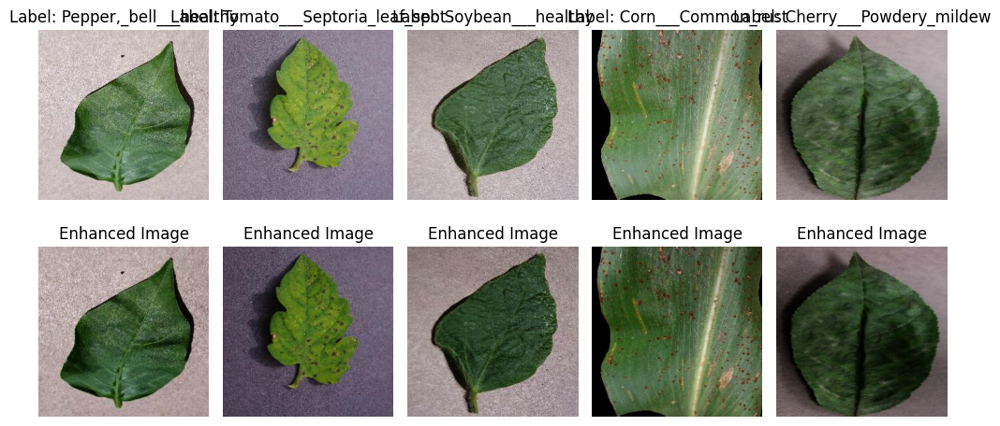

In [ ]:
#plot the random images and their clean versions side by side
np.random.seed(10)
random_indices = np.random.choice(len(train_subset), size=5, replace=False)

fig, axes = plt.subplots(2, 5, figsize=(10, 5))
for i, idx in enumerate(random_indices):
    img, label = train_subset[idx]
    # Original
    img_np = img.permute(1, 2, 0).numpy()
    axes[0, i].imshow(img_np)
    axes[0, i].set_title(f"Label: {dataset.classes[label]}")
    axes[0, i].axis('off')

    # Cleaned
    cleaned_img = enhance(img, up_fac=3)
    axes[1, i].imshow(cleaned_img)
    axes[1, i].set_title("Enhanced Image")
    axes[1, i].axis('off')
plt.tight_layout()
plt.show()

The enhanced results are clearly sharper than the original images but benefits may vary based on the initial lighting conditions, as we might get an even darker image by using a gamma greater than one, and as a consequence lose details such as color and leaf features.

Some images in the dataset inherently are badly detailed, and appear shaky or anyhow end up making image quality lower...

Another concern of enhancement is that it cannot cover all possible situations in real-life application(as this is a static implementation), and that using it for model training implies processing new data uing the same transformations, which implies higher memory(images are upsampled) and requires more computation(and more time as a result).